In [267]:
%matplotlib widget 
# Uncomment for interactive plots when running the notebook!

import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
from time import perf_counter

import import_ipynb

import PyPO
from PyPO.System import System
from PyPO.Enums import Projections, Objects, Units, Scales, FieldComponents, CurrentComponents

In [72]:
# This code allows us to display global variables within markdown output, by overriding the %%markdown magic
from IPython.display import Markdown
from IPython.core.magic import register_cell_magic

@register_cell_magic
def markdown(line, cell):
    return Markdown(cell.format(**globals()))

In [73]:
# Create the optical system
s = System()

2026-03-04 10:21:41 - WARNING - System override set to True. 


# Import SMA antenna parameters

We import the SMA antenna parameters from the `./design/sma_antenna_design.ipynb` notebook

In [74]:
# SMA antenna parameters

# Primary reflector
from design.sma_antenna_design import D_p, F_p, D_s, c_s, a_s, e_s, z_sh, f_s2, alpha

# Calculate distance from secondary edge plane to Cass focus
z_sef2 = (f_s2 + z_sh)

In [75]:
%%markdown 
## Imported Antenna parameters

| Parameter | Variable | Value | Unit |
| --- | --- | --: | --- |
| Primary Diameter | `D_p` | {D_p:.3f} | m |
| Primary Focal Length | `F_p` | {F_p:.3f} | m |
| Angle of edge ray | `alpha` | {alpha:.3f} | rad |
| Secondary Diameter | `D_s` | {D_s:.3f} | m | 
| Secondary Distance to Foci | `c_s` | {c_s:.6f} | m |
| Secondary Distance to Vertex | `a_s` | {a_s:.6f} | m |
| Secondary Eccentricity | `e_s` | {e_s:.6f} |   |
| Height of Secondary | `z_sh` | {z_sh:.6f} | m |
| Distance from Secondary to Focus | `z_sef2` | {z_sef2:.3f} | m |

## Imported Antenna parameters

| Parameter | Variable | Value | Unit |
| --- | --- | --: | --- |
| Primary Diameter | `D_p` | 6.000 | m |
| Primary Focal Length | `F_p` | 2.520 | m |
| Angle of edge ray | `alpha` | 1.074 | rad |
| Secondary Diameter | `D_s` | 0.350 | m | 
| Secondary Distance to Foci | `c_s` | 2.496463 | m |
| Secondary Distance to Vertex | `a_s` | 2.351026 | m |
| Secondary Eccentricity | `e_s` | 1.061861 |   |
| Height of Secondary | `z_sh` | 0.050521 | m |
| Distance from Secondary to Focus | `z_sef2` | 4.898 | m |


# Define a Gaussian feed

We initially define a Gaussian feed at the Cassegrain focus, with an -12 dB edge taper at the plane of the secondary edge, as a basic example of a Cassegrain antenna calculation

In [107]:
# Wavelength in millimeters
lam = 1.3*Units.MM

# Gaussian feed parameters
edge_taper_db = -12.0 # Gaussian edge taper

# beam width at secondary
beamwidth_s = D_s*Units.M / 2 / ( 0.3393 * np.sqrt(-edge_taper_db))

# Calculate beam width at Cassegrain focus using Gaussian beam propagation
beamwidth_cass = beamwidth_s * np.sqrt((1 - np.sqrt(1 - (2*lam*(z_sef2*Units.M) / (np.pi*beamwidth_s**2))**2 ) )/2)
w_0 = beamwidth_cass

# Farfield divergence angle
theta_0 = np.rad2deg(lam / (np.pi*w_0))

# Rayleigh range
rayleigh_range = np.pi*w_0**2 / lam
z_R = rayleigh_range

# Normalization
E0 = np.sqrt(8/(w_0**2)*1e6)

In [108]:
%%markdown

## Gaussian feed parameters

| Parameter | Variable | Value | Unit |
| --- | --- | --: | --- |
| Wavelength | `lam` | {lam:.3f} | mm |
| Beam waist | `w_0` | {w_0:.3f} | mm |
| Rayleigh range | `z_R` | {z_R:.3f} | mm |
| Farfield HWHM  | `theta_0` | {theta_0:.3f} | ° |
| Normalization  | `E0` | {E0:.6g} | √W |


## Gaussian feed parameters

| Parameter | Variable | Value | Unit |
| --- | --- | --: | --- |
| Wavelength | `lam` | 1.300 | mm |
| Beam waist | `w_0` | 13.671 | mm |
| Rayleigh range | `z_R` | 451.630 | mm |
| Farfield HWHM  | `theta_0` | 1.734 | ° |
| Normalization  | `E0` | 206.898 | √W |


In [109]:
## Calculate the required feed_plane size
z = 1.09*np.pi*w_0*20/lam*np.sin(np.atan(D_s*Units.MM/2 / (2*c_s*Units.MM))) + 10
print(z)

po1 = int(z/2.4)
po2 = int(z)

max_po1 = int(2*10*w_0/lam)
max_po2 = int(2*np.pi*10*w_0/lam)

print(f"Estimated Grid size : ({po1:d}, {po2:d})")
print(f"Maximum Grid size   : ({max_po1:d}, {max_po2:d})")

35.22709609182485
Estimated Grid size : (14, 35)
Maximum Grid size   : (210, 660)


In [110]:
# The feed plane defines the source fields - it needs sufficient size and resolution to
# contain the feed.
feed_plane = {
            "name"      : "feed_plane",
            "gmode"     : "uv",
            "lims_u"    : np.array([0, w_0*5])*Units.MM,
            "lims_v"    : np.array([0, 360]),
            "gridsize"  : np.array([101, 720])
            }

s.addPlane(feed_plane)

2026-03-04 10:32:09 - INFO - Added plane feed_plane to system. 


In [111]:
# Create a Gaussian field in the feed plane

feed_dict = {                                                                                                                                                                     
            "name"      : "gaussian_feed",                                                                                                                                  
            "lam"       : lam,                                                                                                      
            "w0x"       : w_0,                                                                                             
            "w0y"       : w_0,                                                                                             
            "n"         : 1,                                                                                                                             
            "E0"        : E0,                                                                                                                                  
            "dxyz"      : 0,                                                                                                 
            "pol"       : np.array([1, 0, 0])                                                                                                          
}

s.createGaussian(feed_dict, "feed_plane")

# Move the feed plane to the Cassegrain focus
s.translateGrids("feed_plane", np.array([0, 0, F_p - 2*c_s])*Units.M)

2026-03-04 10:32:10 - INFO - Translated element feed_plane by ('0.000e+00', '0.000e+00', '-2.473e+03') millimeters. 


In [112]:
feed_grid = s.generateGrids('feed_plane')

## Surface Currents at source

In [113]:
# Check metadata:
print(f'gaussian_feed  k : {s.currents['gaussian_feed'].k}')
print(f'gaussian_feed  T : {s.currents['gaussian_feed'].surf}')


gaussian_feed  k : 4.83321946706122
gaussian_feed  T : feed_plane


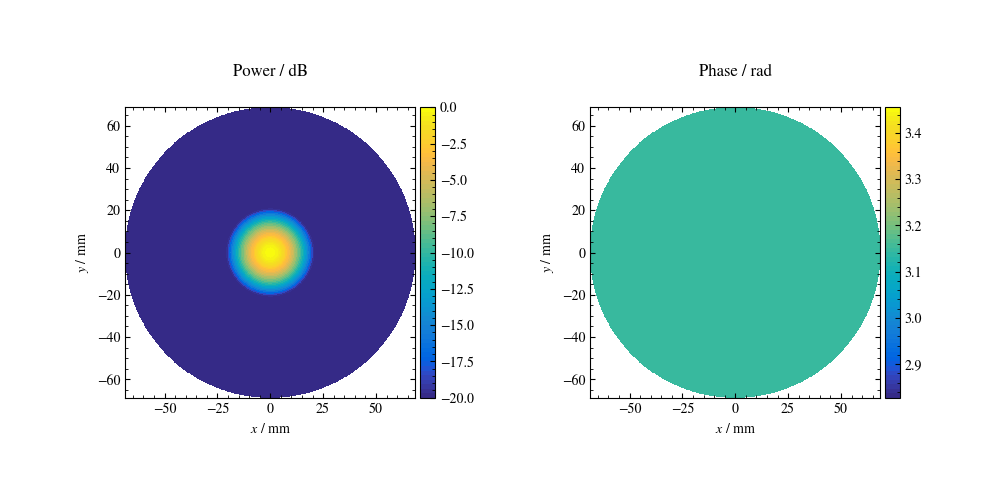

In [114]:
s.plotBeam2D('gaussian_feed', PyPO.Enums.CurrentComponents.My, vmin=-20)

# Define the reflectors

In [115]:
## Calculate the required secondary grid size
z = 1.09*np.pi*D_s*Units.M/lam*np.sin(alpha) + 10
print(z)

po1 = int(z/2.4)
po2 = int(z)

max_po1 = int(D_s*Units.M/lam)
max_po2 = int(2*np.pi*D_s*Units.M/lam)

print(f"Estimated Grid size : ({po1:d}, {po2:d})")
print(f"Maximum Grid size   : ({max_po1:d}, {max_po2:d})")

820.408910848911
Estimated Grid size : (341, 820)
Maximum Grid size   : (269, 1691)


In [116]:
secondary = {
            "name"      : "secondary",
            "pmode"     : "focus",
            "gmode"     : "uv",
            "flip"      : True,
            "focus_1"   : np.array([0, 0, F_p])*Units.M,
            "focus_2"   : np.array([0, 0, F_p - 2*c_s])*Units.M,
            "ecc"       : e_s,
            "lims_u"    : np.array([0, D_s/2])*Units.M,
            "lims_v"    : np.array([0, 360]),
            "gridsize"  : np.array([max_po1, max_po2])
            }
s.addHyperbola(secondary)


2026-03-04 10:32:14 - INFO - Added hyperboloid secondary to system. 


In [117]:
sec_grid = s.generateGrids("secondary")

In [118]:
## Calculate the required primary grid size
z = 1.09*np.pi*D_p*Units.M/lam*np.sin(np.deg2rad(2)) + 10
print(z)

po1 = int(z/2.4)
po2 = int(z)

max_po1 = int(D_p*Units.M/lam)
max_po2 = int(2*np.pi*D_p*Units.M/lam)

print(f"Estimated Grid size : ({po1:d}, {po2:d})")
print(f"Maximum Grid size   : ({max_po1:d}, {max_po2:d})")

561.5735508098546
Estimated Grid size : (233, 561)
Maximum Grid size   : (4615, 28999)


In [119]:

primary = {
            "name"      : "primary",
            "pmode"     : "focus",
            "gmode"     : "uv",
            "vertex"    : np.zeros(3),
            "focus_1"   : np.array([0, 0, F_p])*Units.M,
            "lims_u"    : np.array([D_s/2, D_p/2])*Units.M,
            "lims_v"    : np.array([0, 360]),
            "gridsize"  : np.array([po1, po2])
            }

s.addParabola(primary)

2026-03-04 10:32:23 - INFO - Added paraboloid primary to system. 


In [120]:
pri_grid = s.generateGrids("primary")

# Define the output field planes

In [121]:
secondary_edge_plane = {
            "name"      : "sec_plane",
            "gmode"     : "uv",
            "lims_u"    : np.array([0, D_s/2])*Units.M,
            "lims_v"    : np.array([0, 359]),
            "gridsize"  : np.array([301, 360])
            }
s.addPlane(secondary_edge_plane)

s.translateGrids("sec_plane", np.array([0.0, 0.0, F_p - (c_s - a_s) + z_sh])*Units.M)

farfield_plane = {
            "name"      : "farfield_plane",
            "gmode"     : "AoE",
            "lims_Az"    : np.array([-1.0, 1.0])*2,
            "lims_El"    : np.array([-1.0, 1.0])*2,
            "gridsize"  : np.array([301, 301])
            }
s.addPlane(farfield_plane)

2026-03-04 10:32:25 - INFO - Added plane sec_plane to system. 
2026-03-04 10:32:25 - INFO - Translated element sec_plane by ('0.000e+00', '0.000e+00', '2.425e+03') millimeters. 
2026-03-04 10:32:25 - INFO - Added plane farfield_plane to system. 


# Check the system

We plot the system to check that everything looks right

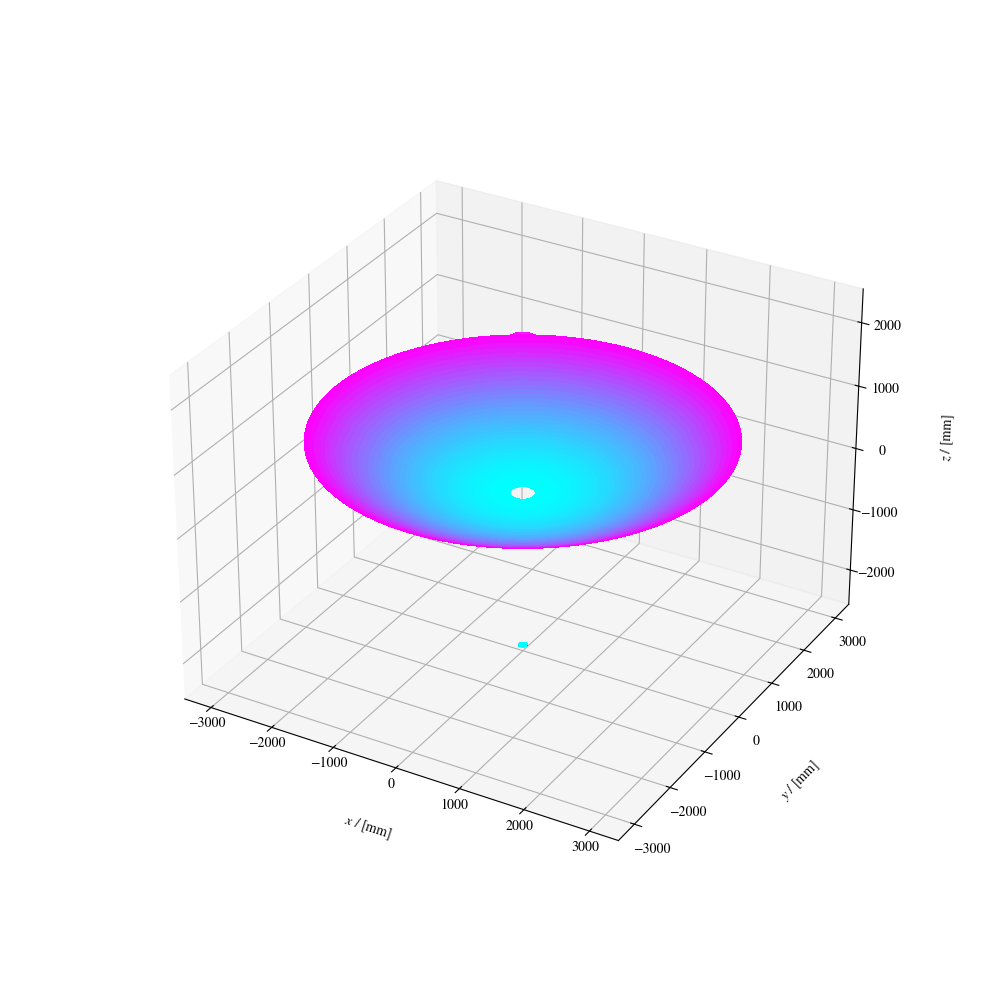

In [122]:
s.plotSystem(select=['secondary', 'sec_plane', 'primary', 'feed_plane'])

# Set up the Physical Optics Calculations

We now setup the physical optics calculations through the system.

The `method` can be either `CPU` or `GPU` to choose between the C and CUDA implementations. This change also affects the
the floating point precision used in the calculations.

The `mode` for intermediate surfaces can be either `JMEH` or `JM`. In the `JMEH`, both the E & H fields and the J & M 
currents are calculated and stored on each surface.  In the `JM` mode, only the currents are stored. Choosing the `JM` mode
is somewhat faster, and uses less RAM.

In [123]:
method = 'GPU'
if method == 'CPU':
    nThreads = 31
else:
    nThreads = 256
mode = 'JMEH'

epsilon = 1.0

In [124]:
# Physical optics calculation definition from feed to secondary
feed_to_sec_PO = {
        "t_name"    : "secondary",
        "s_current" : "gaussian_feed",
        "epsilon"   : epsilon,
        "mode"      : mode,
        "name_JM"   : "JM_sec",
        "name_EH"   : "EH_sec",
        "device"    : method,
        "nThreads"  : nThreads
        }

# Physical optics calculation definition from feed to secondary edge plane
feed_to_sec_plane_PO = {
        "t_name"    : "sec_plane",
        "s_current" : "gaussian_feed",
        "epsilon"   : epsilon,
        "mode"      : "EH",
        "name_EH"   : "EH_sec_plane",
        "device"    : method,
        "nThreads"  : nThreads
        }



# Run the Physical Optics calculation on secondary

We run the full Physical Optics calculations, and collect some perfomance information on the way

In [125]:
start = perf_counter()
step_times = []

s.runPO(feed_to_sec_PO)
step_times.append(perf_counter() - start)

s.runPO(feed_to_sec_plane_PO)
step_times.append(perf_counter() - step_times[-1] - start)

2026-03-04 10:32:31 - WORK - *** Starting PO propagation *** 
2026-03-04 10:32:31 - WORK - Propagating gaussian_feed on feed_plane to secondary, propagation mode: JMEH. 
2026-03-04 10:32:31 - WORK - Hardware: running 256 CUDA threads per block. 
2026-03-04 10:32:31 - WORK - ... Calculating ... 
2026-03-04 10:32:31 - WORK - *** Finished: 0.710 seconds *** 
2026-03-04 10:32:31 - WORK - *** Starting PO propagation *** 
2026-03-04 10:32:31 - WORK - Propagating gaussian_feed on feed_plane to sec_plane, propagation mode: EH. 
2026-03-04 10:32:31 - WORK - Hardware: running 256 CUDA threads per block. 
2026-03-04 10:32:31 - WORK - ... Calculating ... 
2026-03-04 10:32:32 - WORK - *** Finished: 0.334 seconds *** 


## Fields at Secondary Edge Plane

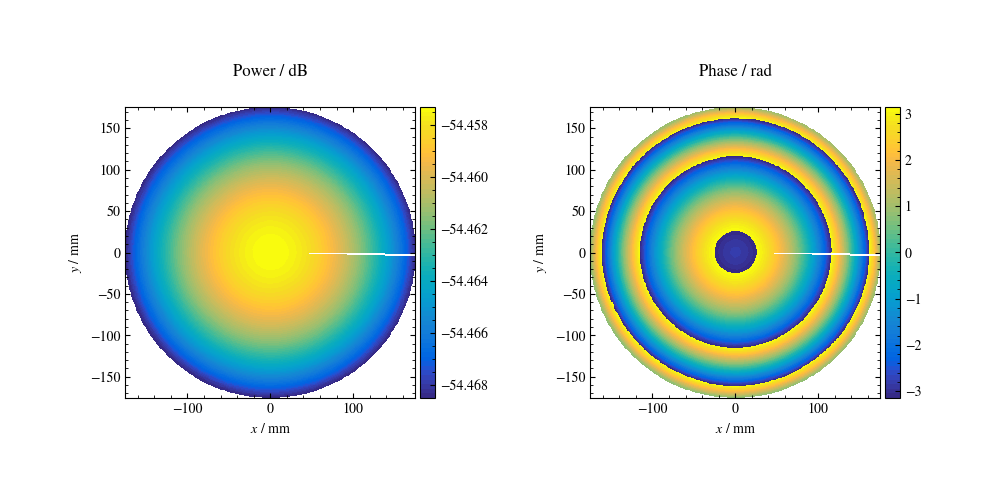

In [126]:
s.plotBeam2D('EH_sec_plane', PyPO.Enums.FieldComponents.Ex, norm=False)

## Fields at Secondary

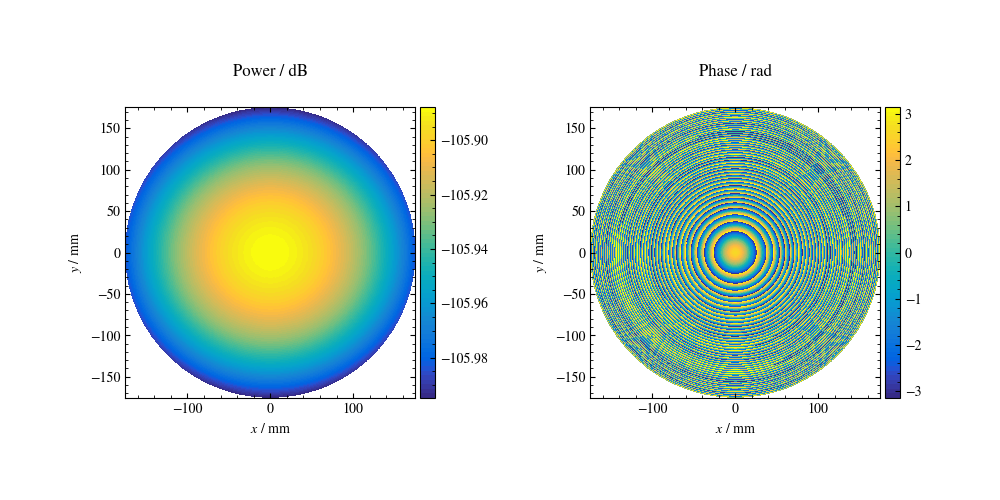

In [127]:
s.plotBeam2D('EH_sec', PyPO.Enums.FieldComponents.Hy, norm=False)

In [128]:
grid = s.generateGrids('secondary')
cut = 0

phase_factor = np.exp(1j*2*np.pi/lam*grid.z)

Text(0, 0.5, 'Phase (rad)')

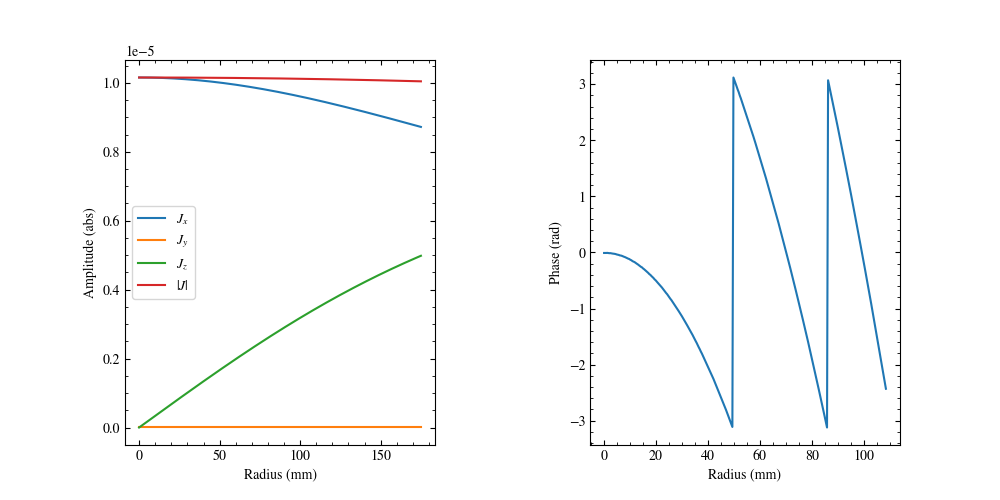

In [129]:

fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})
ax[0].plot(grid.x[:,cut], np.abs(s.currents['JM_sec'].Jx[:,cut]), label='$J_x$')
ax[0].plot(grid.x[:,cut], np.abs(s.currents['JM_sec'].Jy[:,cut]), label='$J_y$')
ax[0].plot(grid.x[:,cut], np.abs(s.currents['JM_sec'].Jz[:,cut]), label='$J_z$')
ax[0].plot(grid.x[:,cut], np.sqrt(np.abs(s.currents['JM_sec'].Jx[:,cut])**2 + np.abs(s.currents['JM_sec'].Jy[:,cut])**2 + np.abs(s.currents['JM_sec'].Jz[:,cut])**2), label='$|J|$')
ax[0].legend()
ax[0].set_xlabel('Radius (mm)')

ax[0].set_ylabel('Amplitude (abs)')

ax[1].plot(grid.y[:,180], np.angle(s.currents['JM_sec'].Jx[:,180]*phase_factor[:,180]))
ax[1].set_xlabel('Radius (mm)')
ax[1].set_ylabel('Phase (rad)')

## Check the field calculations in Python

### Define the grids and fieldAtPoint integrands

In [214]:
# Make vectors of the grids

sec_grid.rho = np.sqrt(sec_grid.y**2 + sec_grid.x**2)
sec_grid.phi = np.atan2(sec_grid.y, sec_grid.x)

sec_grid.r = np.stack([sec_grid.x, sec_grid.y, sec_grid.z], axis=2)
pri_grid.r = np.stack([pri_grid.x, pri_grid.y, pri_grid.z], axis=2)

sec_grid.n = np.stack([sec_grid.nx, sec_grid.ny, sec_grid.nz], axis=2)
pri_grid.n = np.stack([pri_grid.nx, pri_grid.ny, pri_grid.nz], axis=2)

print(sec_grid.r.shape)
print(pri_grid.r.shape)


(269, 1691, 3)
(233, 561, 3)


In [260]:
# Define the field at point integrands

def E_integrand(target_point, source_point, ns, As, js, ms, k, Z0):
    R_vec = source_point - target_point
    R = np.sqrt(np.vecdot(R_vec, R_vec))
    R_hat = np.zeros_like(R_vec)
    for n in range(3):
        R_hat[:,:,n] = R_vec[:,:,n]/R
    
    norm_dot_R = np.vecdot(ns, R_hat)
    
    kR = k * R
    kR_inv = 1/kR
    
    kR_inv_sum1 = -kR_inv**2 + 1j*kR_inv*(kR_inv**2 - 1)
    kR_inv_sum2 = 3*kR_inv**2 + 1j*kR_inv*(1 - 3*kR_inv**2)
    kR_inv_sum3 = kR_inv**2 + 1j*kR_inv
    
    js_dot_R = np.vecdot(R_hat, js)
    
    js_dot_R_R = np.zeros_like(js)
    for n in range(3):
        js_dot_R_R[:,:,n] = js_dot_R[:,:]*R_hat[:,:,n]
    
    ms_cross_R = np.linalg.cross(R_hat, ms)
    
    Green = k**2 / 4*np.pi * np.exp(-1j*kR) * As
    
    d_e_field = np.zeros_like(js)
    for n in range(3):
        d_e_field[:,:,n] = (Z0 * (js[:,:,n]*kR_inv_sum1 + js_dot_R_R[:,:,n]*kR_inv_sum2) - ms_cross_R[:,:,n]*kR_inv_sum3) * Green
    
    return d_e_field

    
def H_integrand(target_point, source_point, ns, As, js, ms, k, Z0):
    R_vec = source_point - target_point
    R = np.sqrt(np.vecdot(R_vec, R_vec))
    R_hat = np.zeros_like(R_vec)
    for n in range(3):
        R_hat[:,:,n] = R_vec[:,:,n]/R
    
    norm_dot_R = np.vecdot(ns, R_hat)
    
    kR = k * R
    kR_inv = 1/kR
    
    kR_inv_sum1 = -kR_inv**2 + 1j*kR_inv*(kR_inv**2 - 1)
    kR_inv_sum2 = 3*kR_inv**2 + 1j*kR_inv*(1 - 3*kR_inv**2)
    kR_inv_sum3 = kR_inv**2 + 1j*kR_inv
    
    ms_dot_R = np.vecdot(ms, R_hat)
    
    ms_dot_R_R = R_hat*ms_dot_R
    
    js_cross_R = np.linalg.cross(R_hat, js)
    
    Green = k**2 / 4*np.pi * np.exp(-1j*kR) * As
    
    d_h_field = (1/Z0 * (ms*kR_inv_sum1 + ms_dot_R_R*kR_inv_sum2) + js_cross_R*kR_inv_sum3) * Green
    
    return d_h_field

### Define test points

In [218]:
# Define a target point
x, y = (150, 45)

point = pri_grid.r[x, y]
point_n = pri_grid.n[x, y]

# Define a source point
i, j = (20, 10)

spoint = sec_grid.r[i,j]
spoint_n = sec_grid.n[i,j]
spoint_A = sec_grid.area[i,j]

### Calculate and test R

In [231]:
R_vec = point - sec_grid.r

R_hat = np.zeros_like(R_vec)
R = np.sqrt(np.vecdot(R_vec, R_vec))
for n in range(3):
    R_hat[:,:,n] = R_vec[:,:,n]/R

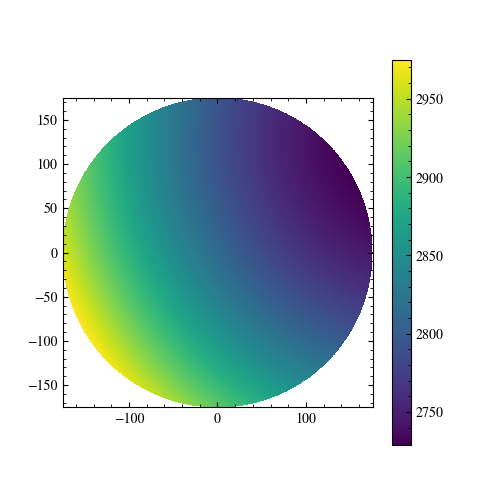

In [232]:
fig, ax = plt.subplots(1,1, figsize=(5,5), gridspec_kw={'wspace':0.5})

ampfig = ax.pcolormesh(sec_grid.x, sec_grid.y, R)

c1 = fig.colorbar(ampfig, orientation='vertical')

ax.set_aspect(1)

### Calculate and test the normals

In [234]:
norm_dot_R = np.vecdot(sec_grid.n, R_hat, axis=2)

norm_abs = np.sqrt(np.vecdot(sec_grid.n, sec_grid.n))

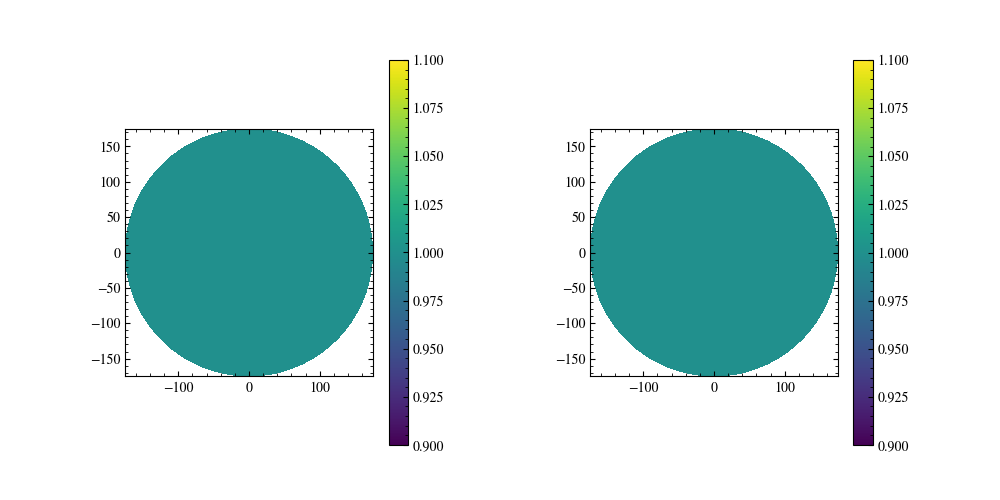

In [236]:
fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})

ampfig = ax[0].pcolormesh(sec_grid.x, sec_grid.y, np.sign(norm_dot_R))
normfig = ax[1].pcolormesh(sec_grid.x, sec_grid.y, norm_abs)

c1 = fig.colorbar(ampfig, orientation='vertical')
c2 = fig.colorbar(normfig, orientation='vertical')

ax[0].set_aspect(1)
ax[1].set_aspect(1)

### Calculate and test the $kR$ and $1/kR$ values

In [237]:
k = s.currents['JM_sec'].k
kR = k * R
kR_inv = 1/kR

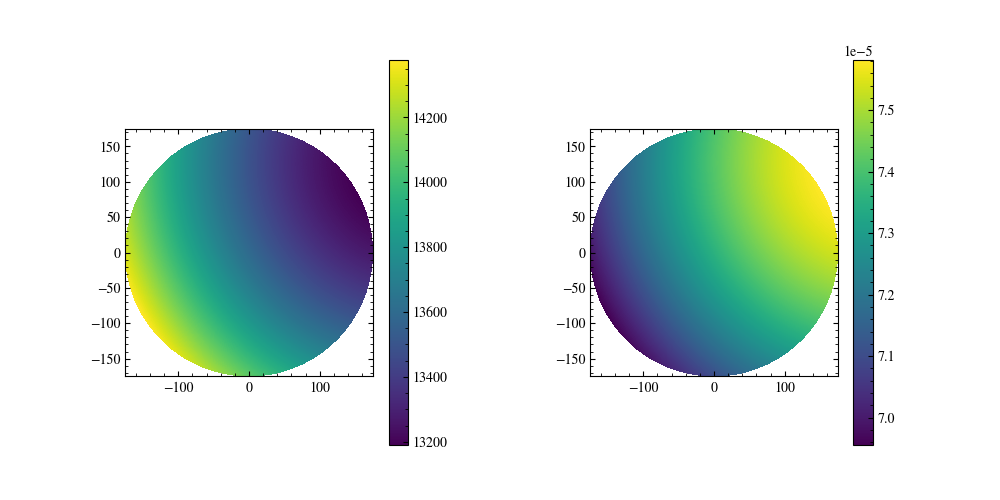

In [238]:
fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})


kR_fig = ax[0].pcolormesh(sec_grid.x, sec_grid.y, kR)
c1 = fig.colorbar(kR_fig, orientation='vertical')

kR_inv_fig = ax[1].pcolormesh(sec_grid.x, sec_grid.y, kR_inv)
c1 = fig.colorbar(kR_inv_fig, orientation='vertical')

ax[0].set_aspect(1)
ax[1].set_aspect(1)

### Calculate and the test the $1/kR$ complex sums

In [239]:
kR_inv_sum1 = -kR_inv**2 + 1j*kR_inv*(kR_inv**2 - 1)

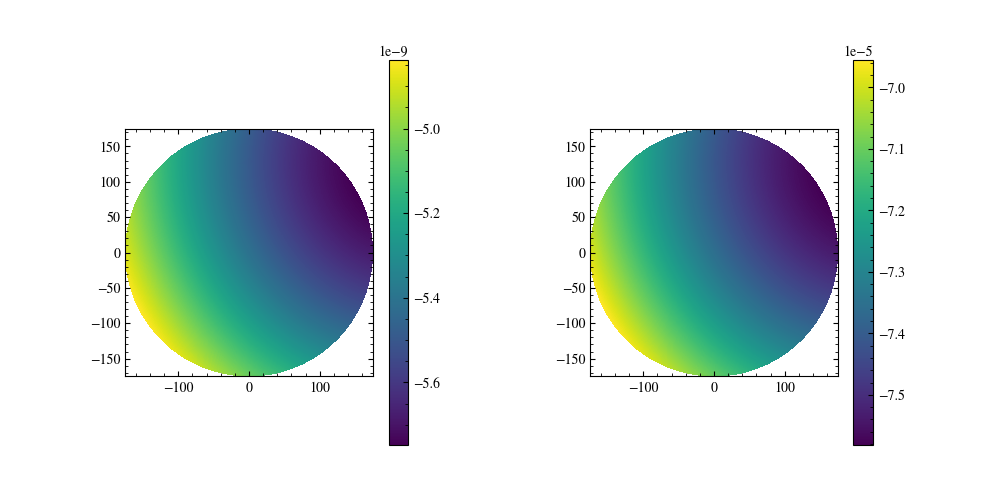

In [240]:
fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})

ampfig = ax[0].pcolormesh(sec_grid.x, sec_grid.y, kR_inv_sum1.real)
phasefig = ax[1].pcolormesh(sec_grid.x, sec_grid.y, kR_inv_sum1.imag)

c1 = fig.colorbar(ampfig, orientation='vertical')
c2 = fig.colorbar(phasefig, orientation='vertical')

ax[0].set_aspect(1)
ax[1].set_aspect(1)

In [241]:
kR_inv_sum2 = 3*kR_inv**2 + 1j*kR_inv*(1 - 3*kR_inv**2)

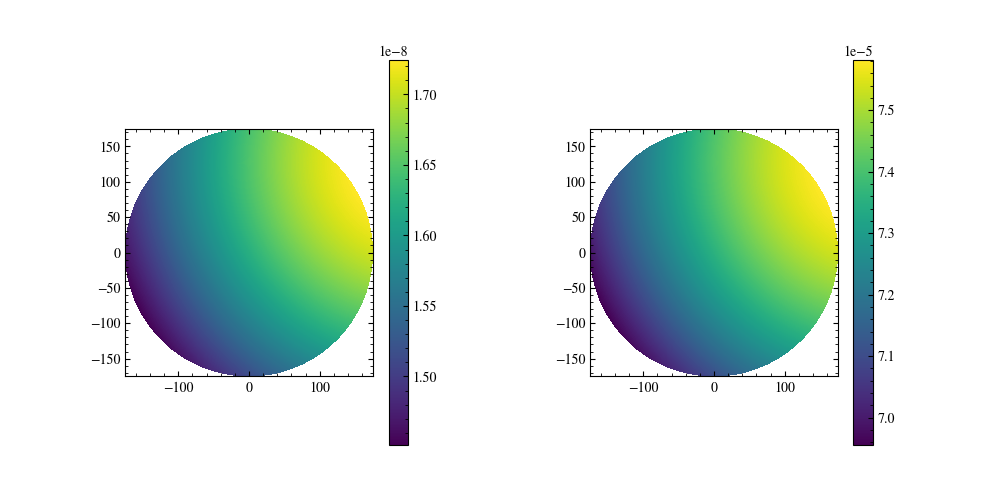

In [242]:
fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})

ampfig = ax[0].pcolormesh(sec_grid.x, sec_grid.y, kR_inv_sum2.real)
phasefig = ax[1].pcolormesh(sec_grid.x, sec_grid.y, kR_inv_sum2.imag)

c1 = fig.colorbar(ampfig, orientation='vertical')
c2 = fig.colorbar(phasefig, orientation='vertical')

ax[0].set_aspect(1)
ax[1].set_aspect(1)

In [243]:
kR_inv_sum3 = kR_inv**2 + 1j*kR_inv

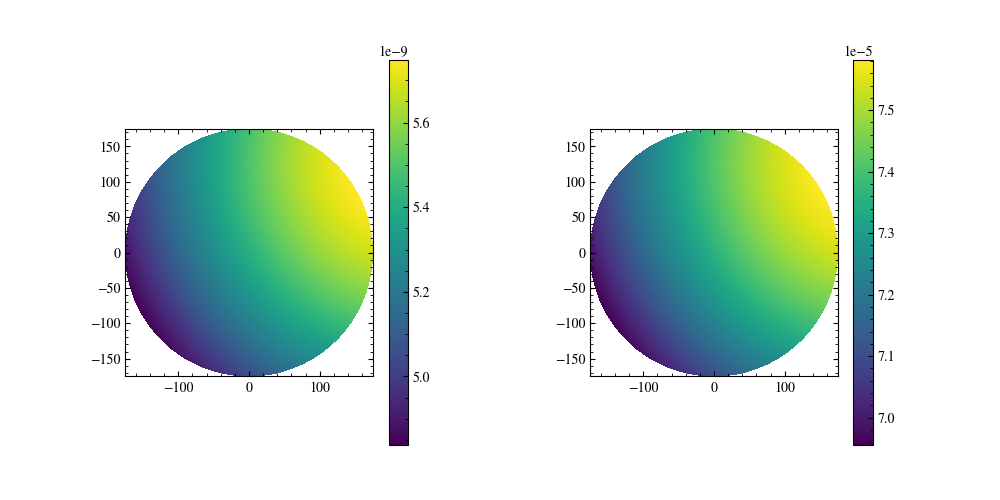

In [244]:
fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})

ampfig = ax[0].pcolormesh(sec_grid.x, sec_grid.y, kR_inv_sum3.real)
phasefig = ax[1].pcolormesh(sec_grid.x, sec_grid.y, kR_inv_sum3.imag)

c1 = fig.colorbar(ampfig, orientation='vertical')
c2 = fig.colorbar(phasefig, orientation='vertical')

ax[0].set_aspect(1)
ax[1].set_aspect(1)

### Calculate and test $\mathbf{J} \cdot \mathbf{R}$ and $(\mathbf{J} \cdot \mathbf{\hat{R}} ) \mathbf{\hat{R}}$

In [245]:
js = np.stack([s.currents['JM_sec'].Jx, s.currents['JM_sec'].Jy, s.currents['JM_sec'].Jz], axis=2 )

js_dot_R = np.vecdot(R_hat, js, axis=2)

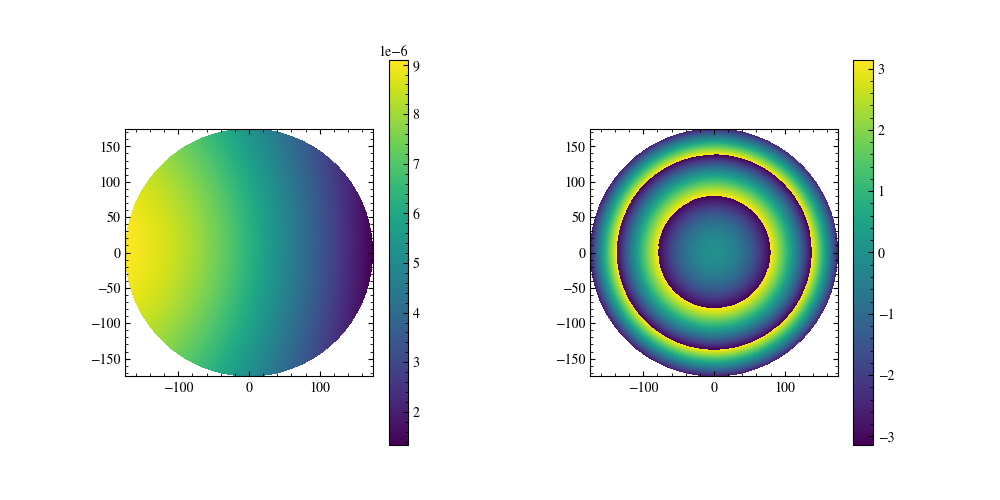

In [246]:
fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})

phase_factor = np.exp(1j*k*sec_grid.z)

ampfig = ax[0].pcolormesh(sec_grid.x, sec_grid.y, np.abs(js_dot_R))
phasefig = ax[1].pcolormesh(sec_grid.x, sec_grid.y, np.angle(js_dot_R*phase_factor))

c1 = fig.colorbar(ampfig, orientation='vertical')
c2 = fig.colorbar(phasefig, orientation='vertical')

ax[0].set_aspect(1)
ax[1].set_aspect(1)

In [247]:
js_dot_R_R = np.zeros_like(js)

for n in range(3):
    js_dot_R_R[:,:,n] = R_hat[:,:,n]*js_dot_R[:,:]

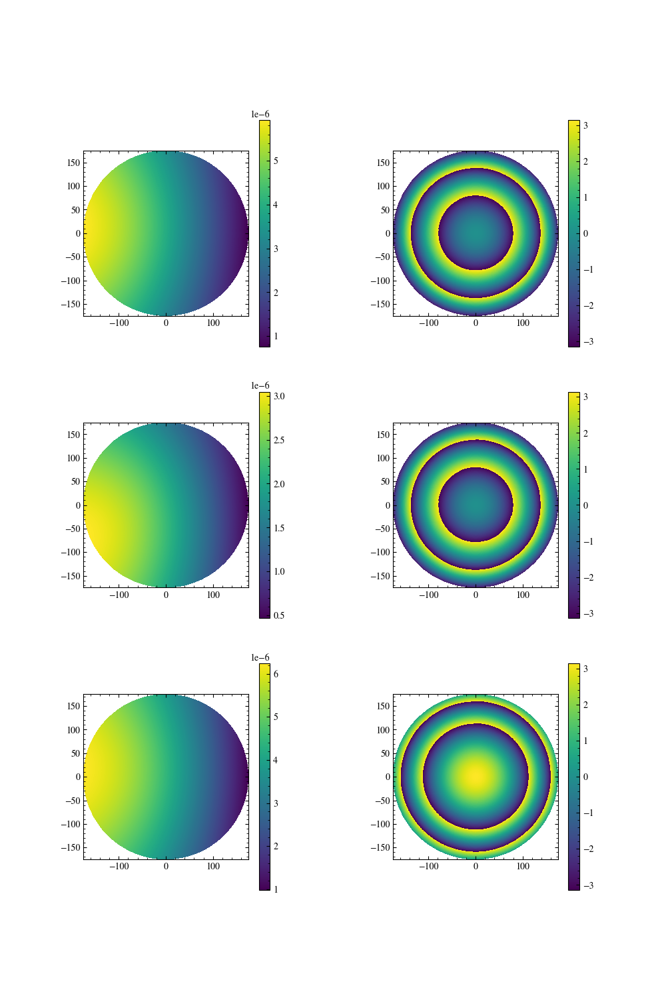

In [248]:
fig, ax = plt.subplots(3,2, figsize=(10,15), gridspec_kw={'wspace':0.5})

phase_factor = np.exp(1j*2*np.pi/lam*sec_grid.z)

for n in range(3):
    ampfig = ax[n,0].pcolormesh(sec_grid.x, sec_grid.y, np.abs(js_dot_R_R[:,:,n]))
    phasefig = ax[n,1].pcolormesh(sec_grid.x, sec_grid.y, np.angle(js_dot_R_R[:,:,n]*phase_factor))

    c1 = fig.colorbar(ampfig, orientation='vertical')
    c2 = fig.colorbar(phasefig, orientation='vertical')

    ax[n,0].set_aspect(1)
    ax[n,1].set_aspect(1)

### Calculate and test $\mathbf{\hat{R}} \times \mathbf{M}$

In [249]:
ms = np.stack([s.currents['JM_sec'].Mx, s.currents['JM_sec'].My, s.currents['JM_sec'].Mz], axis=2 )

R_cross_ms = np.linalg.cross(R_hat, ms, axis=2)

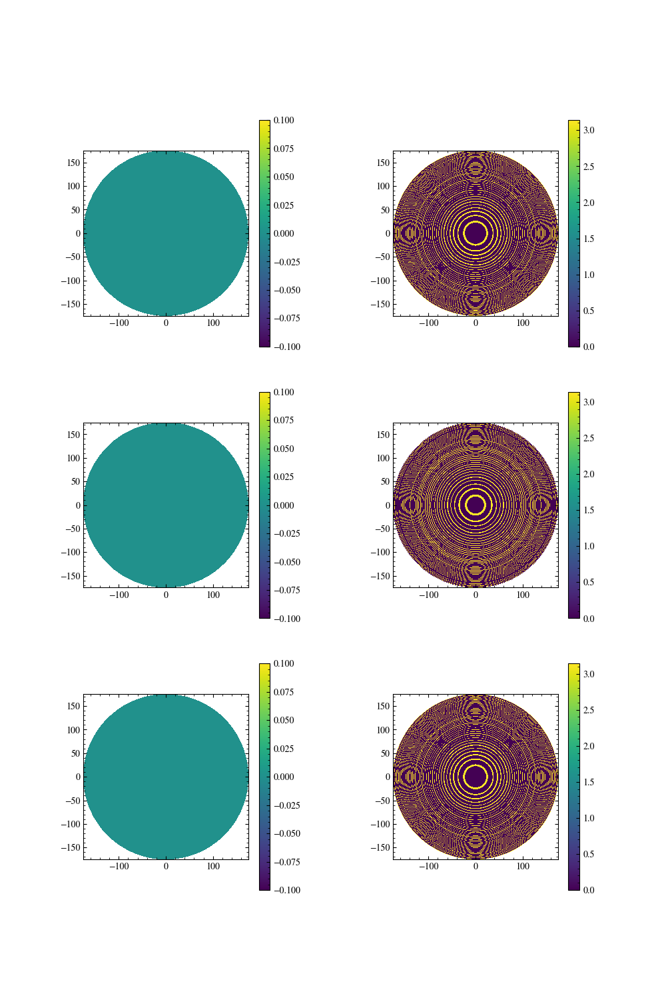

In [250]:
fig, ax = plt.subplots(3,2, figsize=(10,15), gridspec_kw={'wspace':0.5})

phase_factor = np.exp(1j*k*sec_grid.z)

for n in range(3):
    ampfig = ax[n,0].pcolormesh(sec_grid.x, sec_grid.y, np.abs(R_cross_ms[:,:,n]))
    phasefig = ax[n,1].pcolormesh(sec_grid.x, sec_grid.y, np.angle(R_cross_ms[:,:,n]*phase_factor))

    c1 = fig.colorbar(ampfig, orientation='vertical')
    c2 = fig.colorbar(phasefig, orientation='vertical')

    ax[n,0].set_aspect(1)
    ax[n,1].set_aspect(1)

### Calculate and test the Green's function

In [251]:
Green = k**2 / 4*np.pi * np.exp(-1j*kR) * sec_grid.area

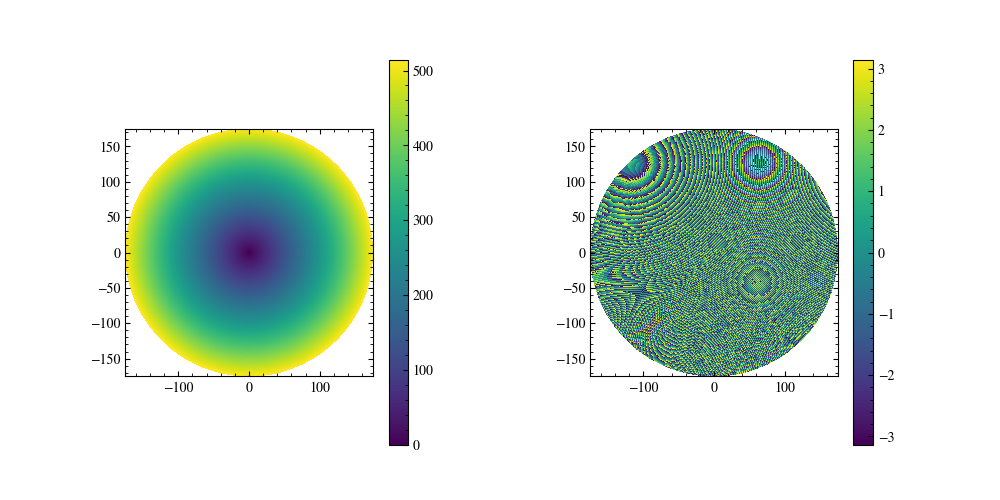

In [252]:
fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})

ampfig = ax[0].pcolormesh(sec_grid.x, sec_grid.y, np.abs(Green))
phasefig = ax[1].pcolormesh(sec_grid.x, sec_grid.y, np.angle(Green))

c0 = fig.colorbar(ampfig, orientation='vertical')
c1 = fig.colorbar(phasefig, orientation='vertical')

ax[0].set_aspect(1)
ax[1].set_aspect(1)

### Calculate and test the E-field integrand


In [261]:
E_int =  E_integrand(point, sec_grid.r, sec_grid.n, sec_grid.area, js, ms, k, 377)

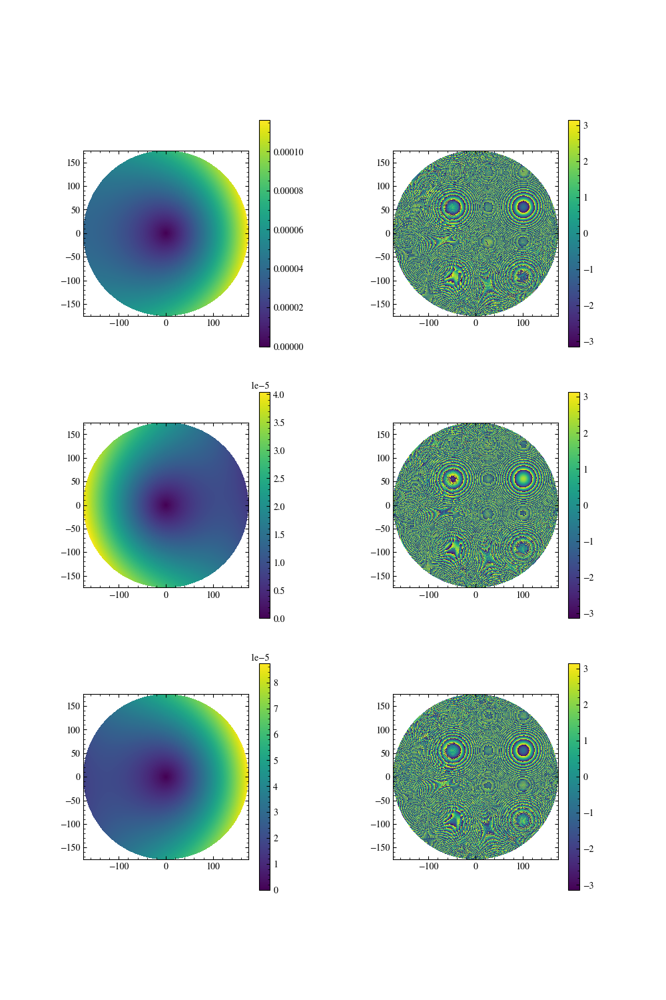

In [265]:
fig, ax = plt.subplots(3,2, figsize=(10,15), gridspec_kw={'wspace':0.5})

for n in range(3):
    ampfig = ax[n,0].pcolormesh(sec_grid.x, sec_grid.y, np.abs(E_int[:,:,n]))
    phasefig = ax[n,1].pcolormesh(sec_grid.x, sec_grid.y, np.angle(E_int[:,:,n]))

    fig.colorbar(ampfig, orientation='vertical')
    fig.colorbar(phasefig, orientation='vertical')

    ax[n,0].set_aspect(1)
    ax[n,1].set_aspect(1)


### Test integrating over the v axis

In [291]:
E_vint = np.sum(E_int, axis=1)

Text(0, 0.5, 'Phase (rad)')

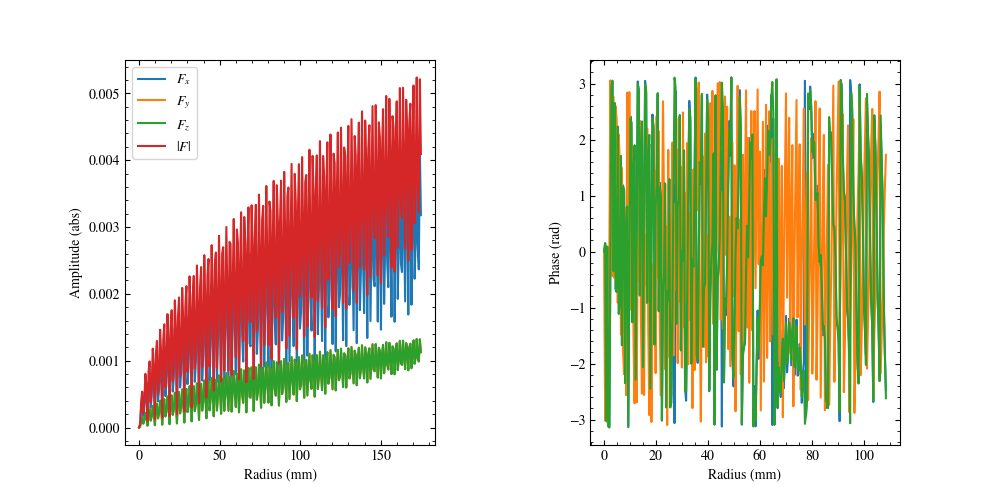

In [294]:

field = E_vint

fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})
ax[0].plot(sec_grid.x[:,0], np.abs(field[:,0]), label='$F_x$')
ax[0].plot(sec_grid.x[:,0], np.abs(field[:,1]), label='$F_y$')
ax[0].plot(sec_grid.x[:,0], np.abs(field[:,1]), label='$F_z$')

ax[0].plot(sec_grid.x[:,cut], np.sqrt(np.abs(field[:,0])**2 + np.abs(field[:,1])**2 + np.abs(field[:,2])**2), label='$|F|$')
ax[0].legend()
ax[0].set_xlabel('Radius (mm)')

ax[0].set_ylabel('Amplitude (abs)')

ax[1].plot(sec_grid.y[:,180], np.angle(field[:,0]), label='$F_x$')
ax[1].plot(sec_grid.y[:,180], np.angle(field[:,1]), label='$F_y$')
ax[1].plot(sec_grid.y[:,180], np.angle(field[:,2]), label='$F_z$')
ax[1].set_xlabel('Radius (mm)')
ax[1].set_ylabel('Phase (rad)')

### Test integrating over the u axis

In [289]:
E_uint = sp.integrate.trapezoid(E_int, axis=0)

Text(0, 0.5, 'Phase (rad)')

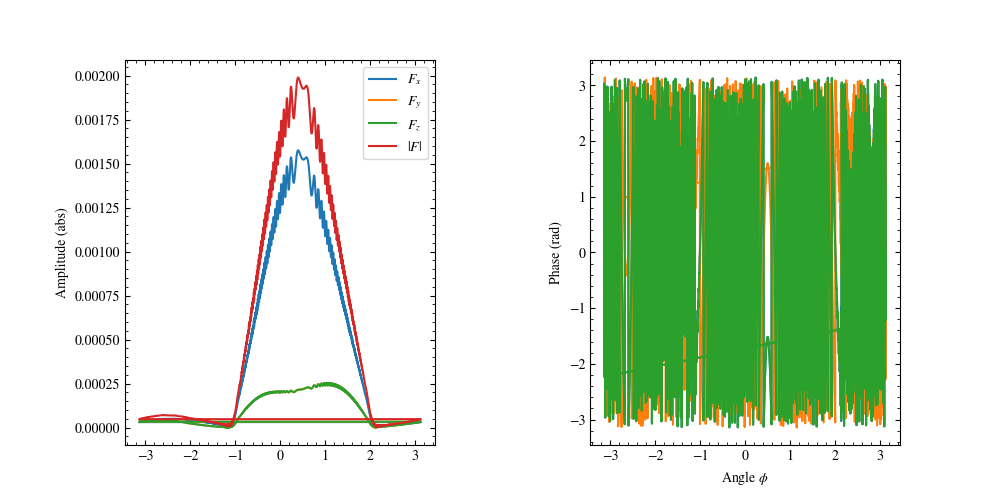

In [303]:
field = E_uint

fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})
ax[0].plot(sec_grid.phi[-1,:], np.abs(field[:,0]), label='$F_x$')
ax[0].plot(sec_grid.phi[-1,:], np.abs(field[:,1]), label='$F_y$')
ax[0].plot(sec_grid.phi[-1,:], np.abs(field[:,1]), label='$F_z$')

ax[0].plot(sec_grid.phi[-1,:], np.sqrt(np.abs(field[:,0])**2 + np.abs(field[:,1])**2 + np.abs(field[:,2])**2), label='$|F|$')
ax[0].legend()
ax[1].set_xlabel('Angle $\phi$')
ax[0].set_ylabel('Amplitude (abs)')

ax[1].plot(sec_grid.phi[-1,:], np.angle(field[:,0]), label='$F_x$')
ax[1].plot(sec_grid.phi[-1,:], np.angle(field[:,1]), label='$F_y$')
ax[1].plot(sec_grid.phi[-1,:], np.angle(field[:,2]), label='$F_z$')
ax[1].set_xlabel('Angle $\phi$')
ax[1].set_ylabel('Phase (rad)')

### Test integrating over other axis

In [304]:
E_vu = sp.integrate.trapezoid(E_vint, axis=0)
E_uv = np.sum(E_uint, axis=0)

print(f"E_vu: ({E_vu[0].real:.4e}+{E_vu[0].imag:.4e}i, {E_vu[1].real:.4e}+{E_vu[1].imag:.4e}i, {E_vu[2].real:.4e}+{E_vu[2].imag:.4e}i)")
print(f"E_uv: ({E_uv[0].real:.4e}+{E_uv[0].imag:.4e}i, {E_uv[1].real:.4e}+{E_uv[1].imag:.4e}i, {E_uv[2].real:.4e}+{E_uv[2].imag:.4e}i)")


E_vu: (-3.5384e-02+-3.7897e-02i, 6.2195e-03+5.7318e-03i, -2.6483e-02+-2.8629e-02i)
E_uv: (-3.5384e-02+-3.7897e-02i, 6.2195e-03+5.7318e-03i, -2.6483e-02+-2.8629e-02i)


# PO from Sec to primary

In [ ]:

# Physical optics calculation definition from secondary to primary
sec_to_pri_PO = {
        "t_name"    : "primary",
        "s_current" : "JM_sec",
        "epsilon"   : epsilon,
        "mode"      : mode,
        "name_JM"   : "JM_pri",
        "name_EH"   : "EH_pri",
        "device"    : method,
        "nThreads"  : nThreads
        }

# Physical optics calculation definition from primary to far field
pri_to_ff_PO = {
        "t_name"    : "farfield_plane",
        "s_current" : "JM_pri",
        "epsilon"   : epsilon,
        "mode"      : "FF",
        "name_EH"   : "EH_ff",
        "device"    : method,
        "nThreads"  : nThreads
        }

# Physical optics calculation definition from primary to far field
pri_to_apert_PO = {
        "t_name"    : "primary_aperture_plane",
        "s_current" : "JM_pri",
        "epsilon"   : epsilon,
        "mode"      : "EH",
        "name_EH"   : "EH_aperture",
        "device"    : method,
        "nThreads"  : nThreads
        }

In [ ]:

s.runPO(sec_to_pri_PO)
step_times.append(perf_counter() - step_times[-1] - start)


In [21]:

s.runPO(sec_to_pri_PO)
step_times.append(perf_counter() - step_times[-1] - start)


[2.2934964600135572, 4.066240360989468]


In [ ]:


s.runPO(pri_to_ff_PO)
step_times.append(perf_counter() - step_times[-1] - start )


s.runPO(pri_to_apert_PO)
step_times.append(perf_counter() - step_times[-1] - start )
print(step_times)

# Run Physical Optics on the Primary

In [131]:

s.runPO(sec_to_pri_PO)
step_times.append(perf_counter() - step_times[-1] - start)


2026-03-03 17:08:53 - WORK - *** Starting PO propagation *** 
2026-03-03 17:08:53 - WORK - Propagating JM_sec on secondary to primary, propagation mode: JMEH. 
2026-03-03 17:08:53 - WORK - Hardware: running 256 CUDA threads per block. 
2026-03-03 17:08:53 - WORK - ... Calculating ... 
2026-03-03 17:08:59 - WORK - *** Finished: 5.202 seconds *** 


## Fields at Primary

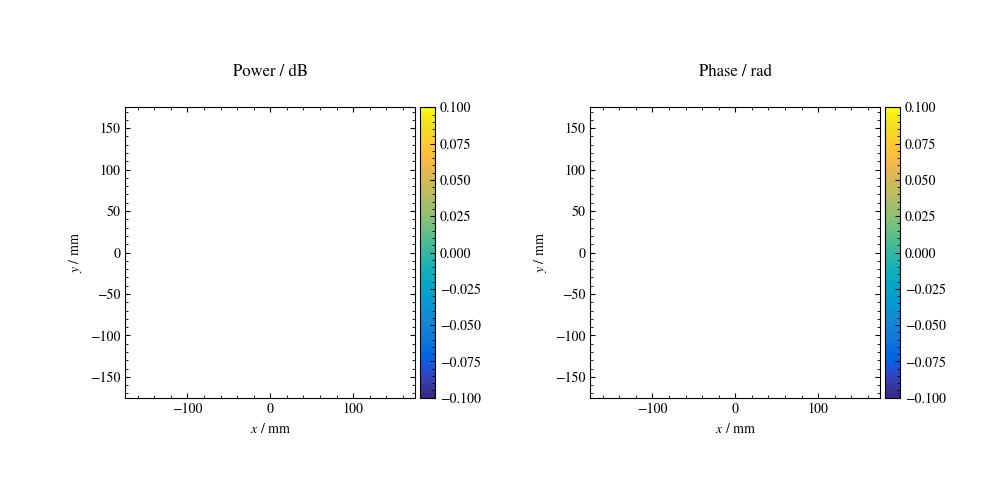

In [27]:
s.plotBeam2D('EH_pri', PyPO.Enums.FieldComponents.Ex, norm=False)

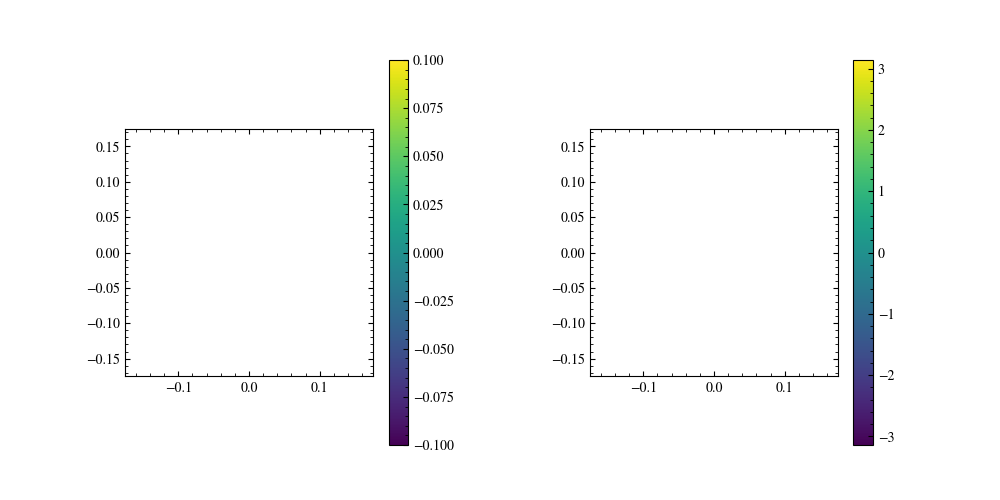

In [28]:
s.plotBeam2D('EH_pri', PyPO.Enums.FieldComponents.Ey, norm=False)

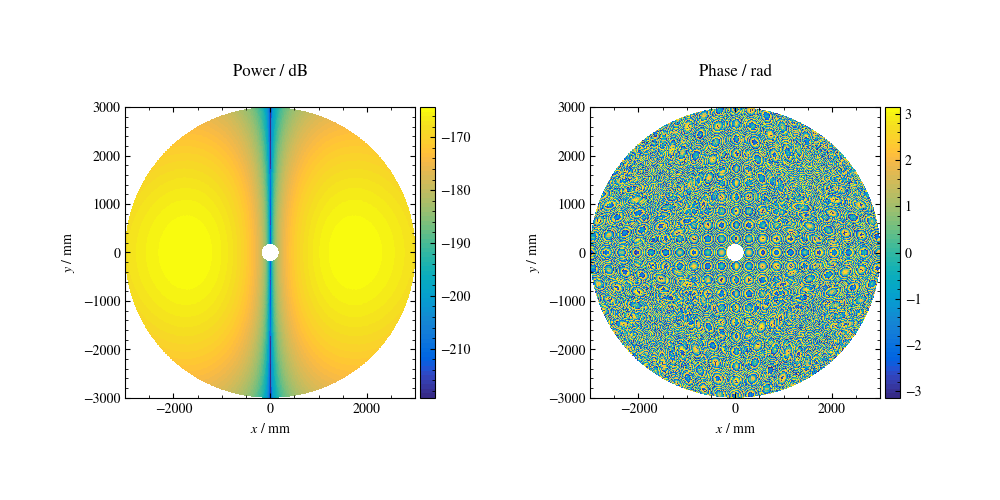

In [105]:
s.plotBeam2D('EH_pri', PyPO.Enums.FieldComponents.Ez, norm=False)

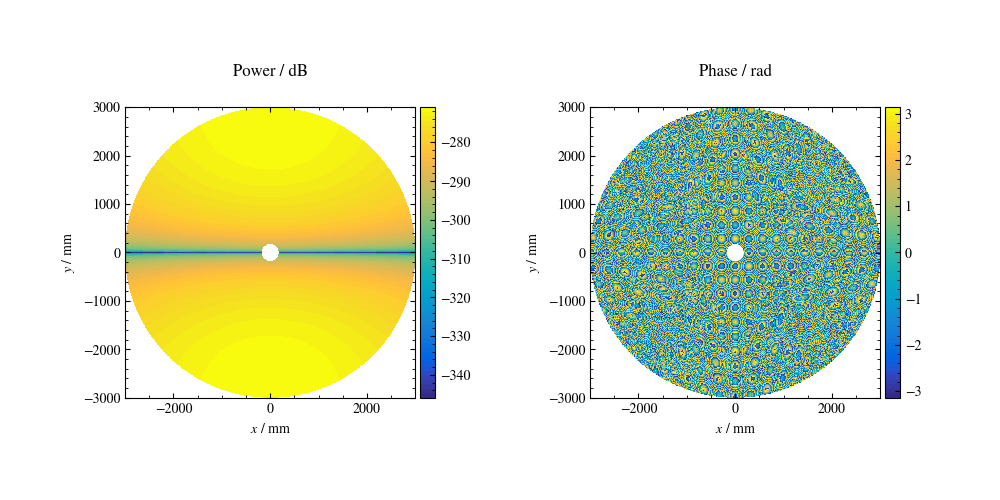

In [106]:
s.plotBeam2D('EH_pri', PyPO.Enums.FieldComponents.Hx, norm=False)

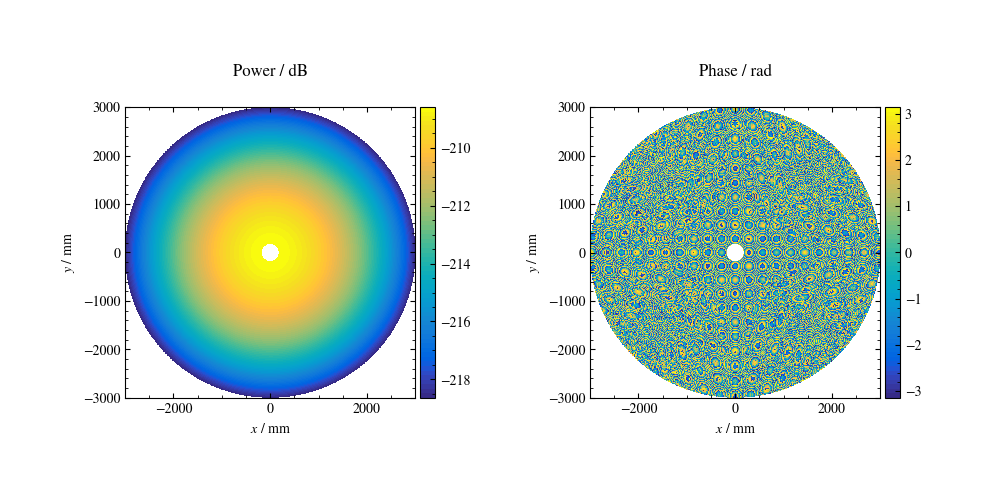

In [107]:
s.plotBeam2D('EH_pri', PyPO.Enums.FieldComponents.Hy, norm=False)

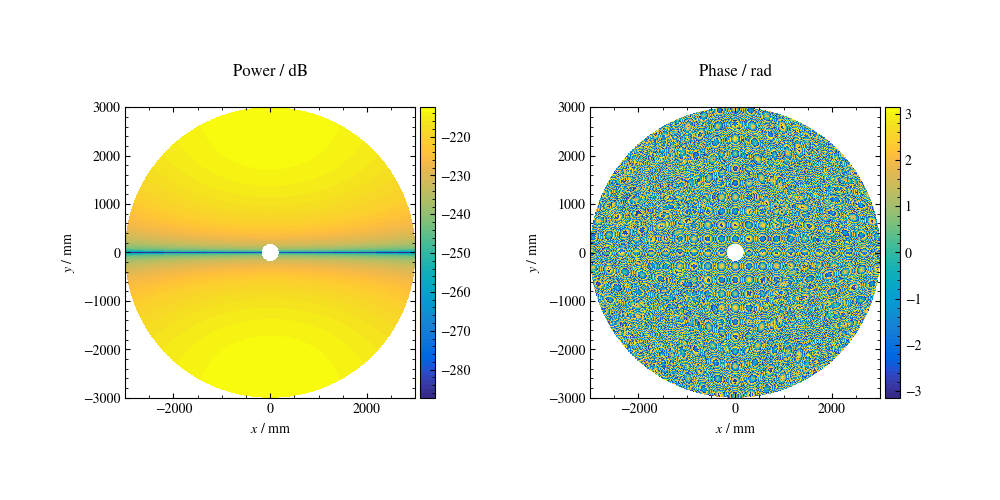

In [108]:
s.plotBeam2D('EH_pri', PyPO.Enums.FieldComponents.Hz, norm=False)

## Currents on Primary

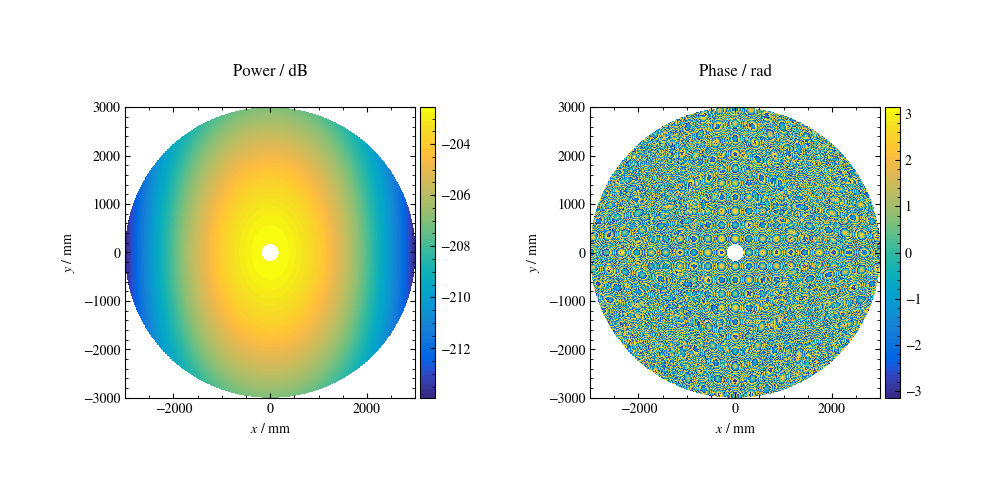

In [109]:
s.plotBeam2D('JM_pri', PyPO.Enums.CurrentComponents.Jx, norm=False)

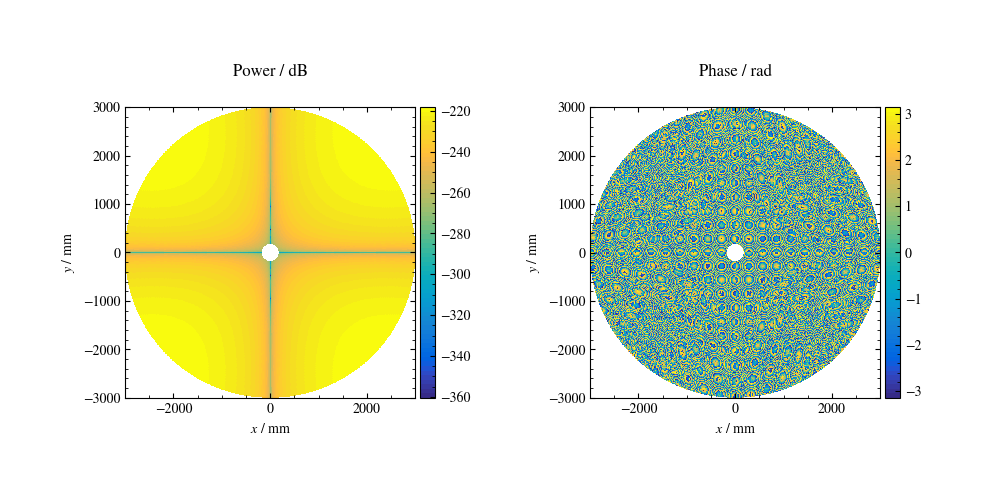

In [110]:
s.plotBeam2D('JM_pri', PyPO.Enums.CurrentComponents.Jy, norm=False)

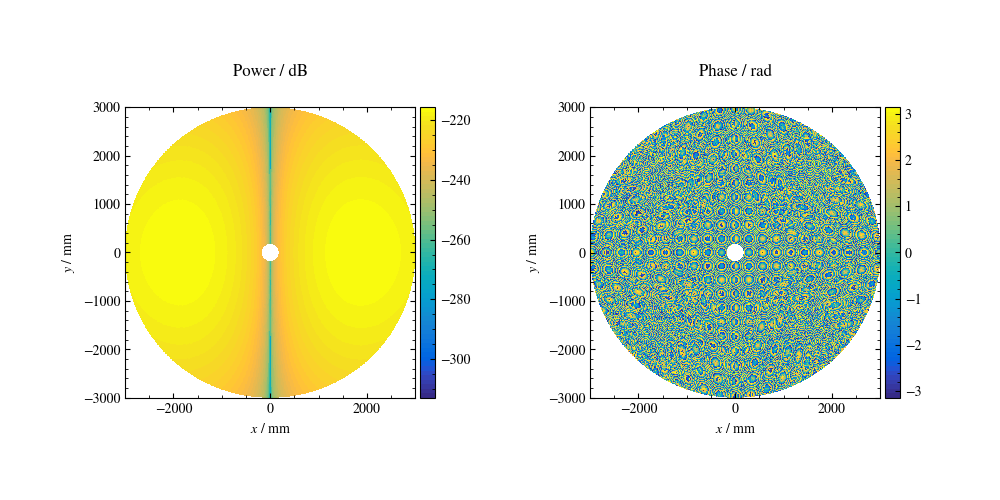

In [111]:
s.plotBeam2D('JM_pri', PyPO.Enums.CurrentComponents.Jz, norm=False)

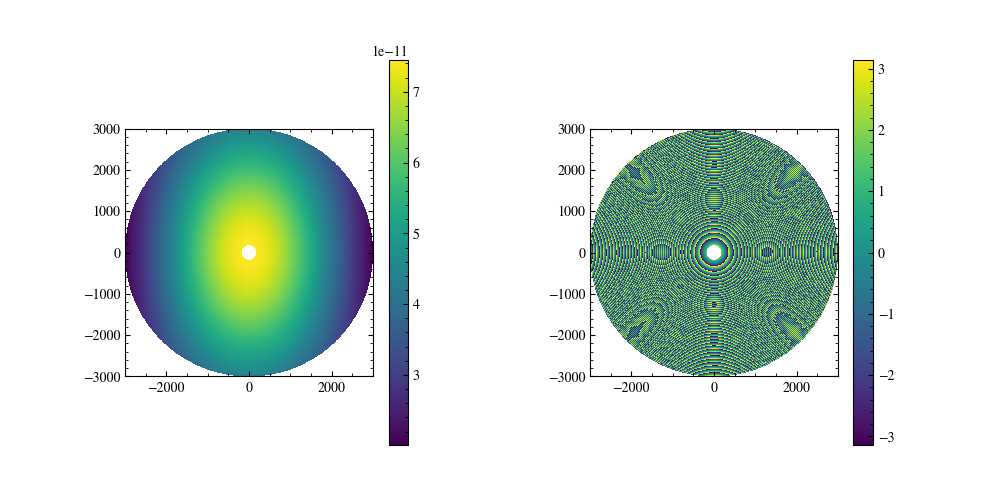

In [123]:
efield = s.currents['JM_pri'].Jx
grid = s.generateGrids('primary')
x_grid = grid.x
y_grid = grid.y
z_grid = grid.z
phase_factor = np.exp(1j*2*np.pi/lam*z_grid)
#phase_factor = 1
fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})

ampfig = ax[0].pcolormesh(x_grid, y_grid, np.abs(efield))
phasefig = ax[1].pcolormesh(x_grid, y_grid, np.angle(efield*phase_factor), vmax=np.pi, vmin=-np.pi)

c1 = fig.colorbar(ampfig, orientation='vertical')
c2 = fig.colorbar(phasefig, orientation='vertical')

ax[0].set_aspect(1)
ax[1].set_aspect(1)

Text(0, 0.5, 'Phase (rad)')

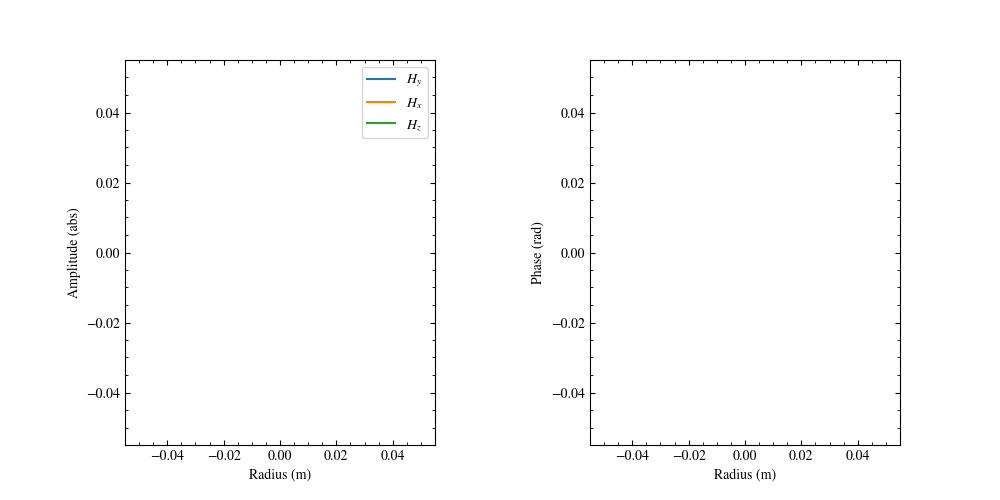

In [29]:
cut = 90

fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})
ax[0].plot(grid.y[:,cut], np.abs(s.currents['JM_pri'].Jx[:,cut]), label='$J_x$')
ax[0].plot(grid.y[:,cut], np.abs(s.currents['JM_pri'].Jy[:,cut]), label='$J_y$')
ax[0].plot(grid.y[:,cut], np.abs(s.currents['JM_pri'].Jz[:,cut]), label='$J_z$')
ax[0].legend()
ax[0].set_xlabel('Radius (m)')
ax[0].set_ylabel('Amplitude (abs)')

ax[1].plot(grid.y[:,cut], np.unwrap(np.angle(s.currents['JM_pri'].Jx[:,cut]*phase_factor[:,cut])))
ax[1].set_xlabel('Radius (m)')
ax[1].set_ylabel('Phase (rad)')

Text(0, 0.5, 'Normal (a.u)')

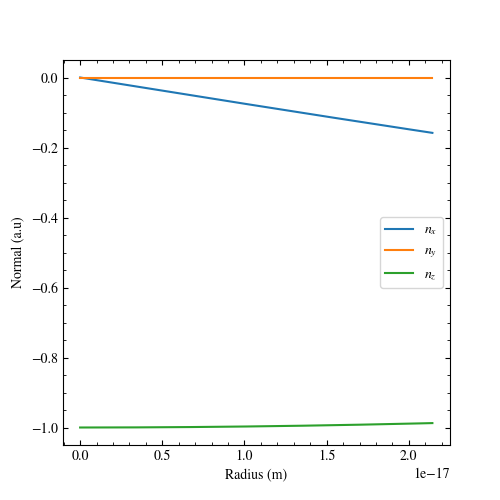

In [30]:
fig, ax = plt.subplots(1,1, figsize=(5,5), gridspec_kw={'wspace':0.5})
ax.plot(grid.y[:,180], grid.nx[:,180], label='$n_x$')
ax.plot(grid.y[:,180], grid.ny[:,180], label='$n_y$')
ax.plot(grid.y[:,180], grid.nz[:,180], label='$n_z$')
ax.legend()

ax.set_xlabel('Radius (m)')
ax.set_ylabel('Normal (a.u)')

# Farfield Beams

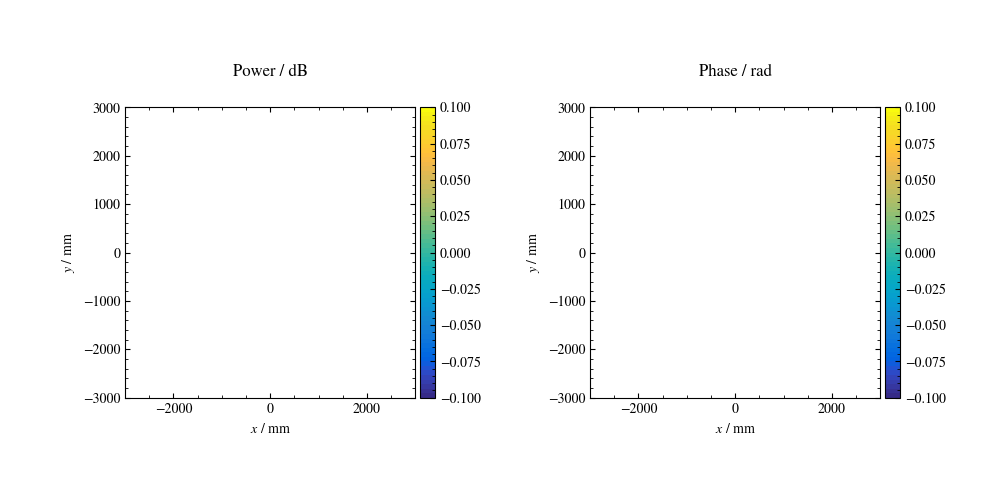

In [31]:
s.plotBeam2D('JM_pri', PyPO.Enums.CurrentComponents.Jx, unwrap_phase=True)

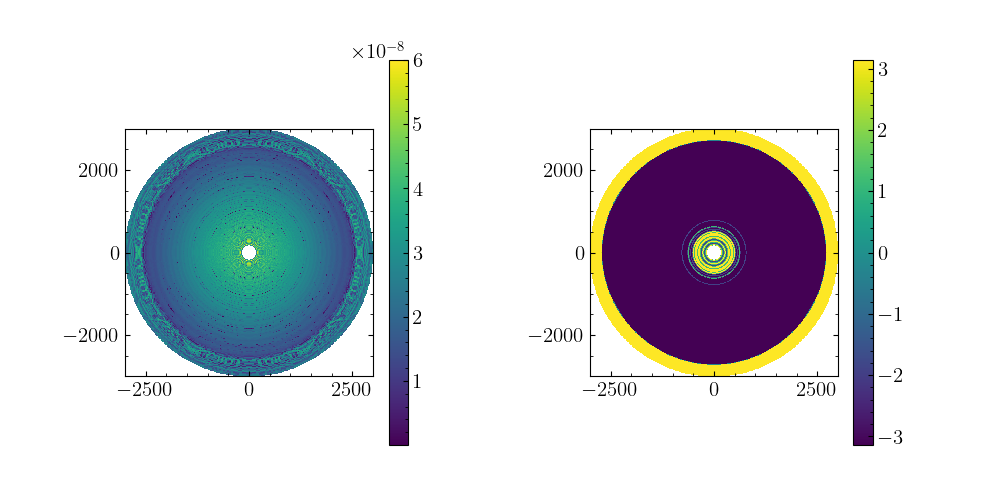

In [59]:
efield = s.currents['JM_pri'].Jx
grid = s.generateGrids('primary')
x_grid = grid.x
y_grid = grid.y
z_grid = grid.z
phase_factor = np.exp(-1j*2*np.pi/lam*z_grid)
#phase_factor = 1
fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})

ampfig = ax[0].pcolormesh(x_grid, y_grid, np.abs(efield))
phasefig = ax[1].pcolormesh(x_grid, y_grid, np.unwrap(np.unwrap(np.angle(efield*phase_factor), axis=0), axis=1), vmax=np.pi, vmin=-np.pi)

c1 = fig.colorbar(ampfig, orientation='vertical')
c2 = fig.colorbar(phasefig, orientation='vertical')

ax[0].set_aspect(1)
ax[1].set_aspect(1)

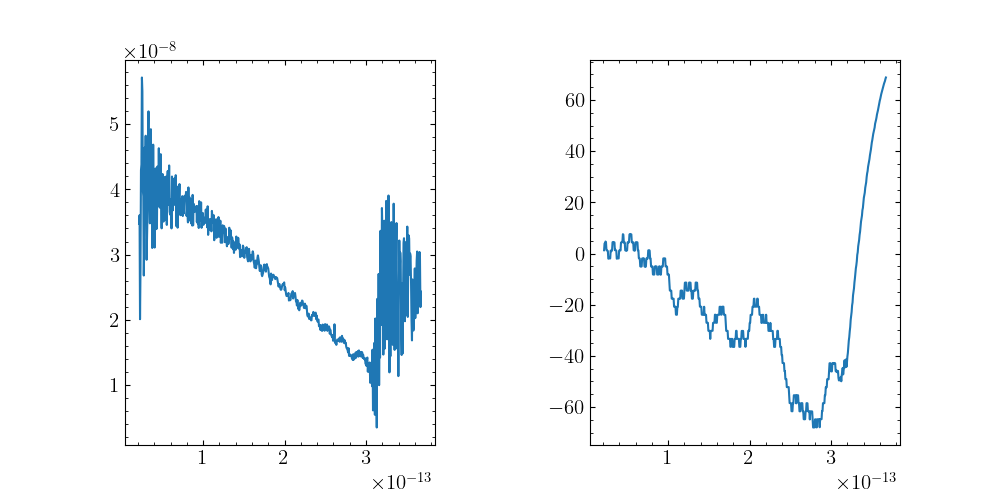

In [60]:
fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})
ax[0].plot(grid.y[:,180], np.abs(efield[:,180]))
ax[1].plot(grid.y[:,180], np.unwrap(np.angle(efield[:,180]*phase_factor[:,180])))

## Incident H-field on Primary

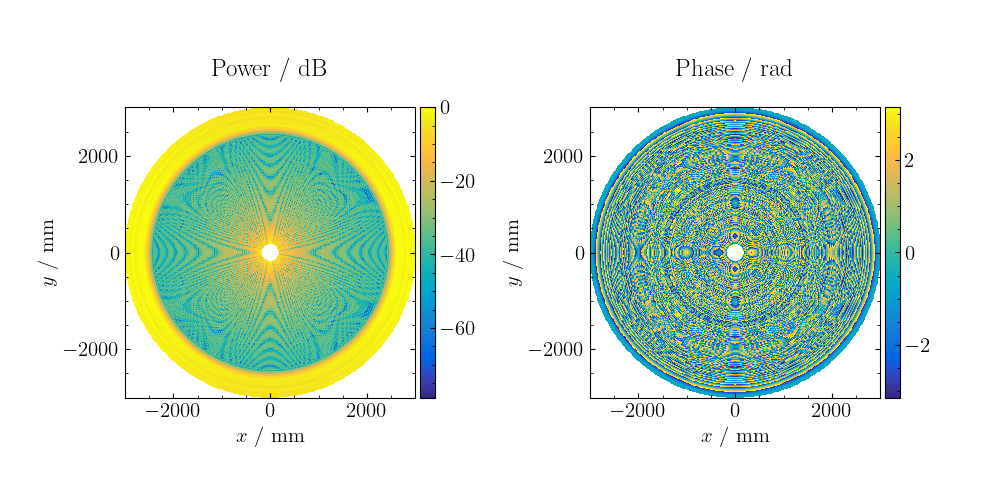

In [61]:
s.plotBeam2D('EH_pri', PyPO.Enums.FieldComponents.Hy, norm=False)

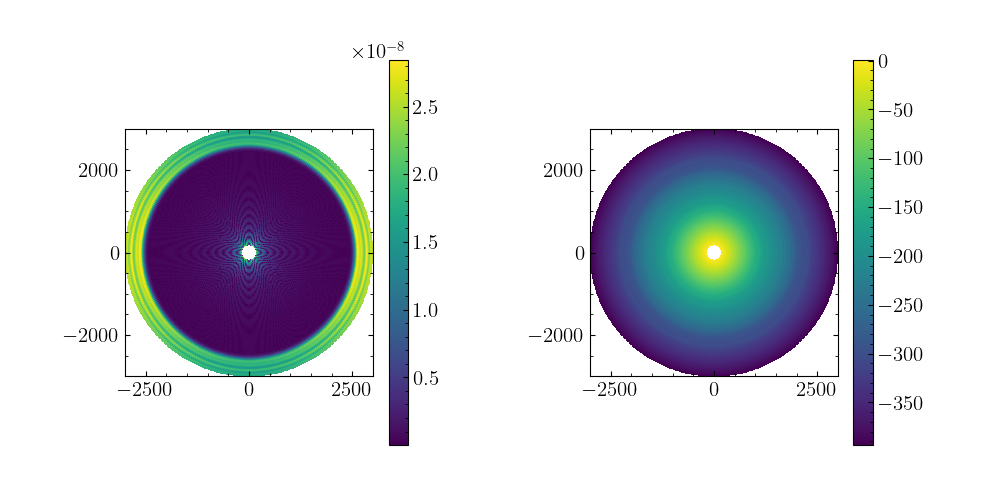

In [62]:
efield = s.fields['EH_pri'].Hy
grid = s.generateGrids('primary')
x_grid = grid.x
y_grid = grid.y
z_grid = grid.z
phase_factor = np.exp(1j*2*np.pi/lam*z_grid)
#phase_factor = 1
fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})

ampfig = ax[0].pcolormesh(x_grid, y_grid, np.abs(efield))
phasefig = ax[1].pcolormesh(x_grid, y_grid, np.unwrap(np.unwrap(np.angle(efield*phase_factor), axis=0), axis=1))

c1 = fig.colorbar(ampfig, orientation='vertical')
c2 = fig.colorbar(phasefig, orientation='vertical')

ax[0].set_aspect(1)
ax[1].set_aspect(1)

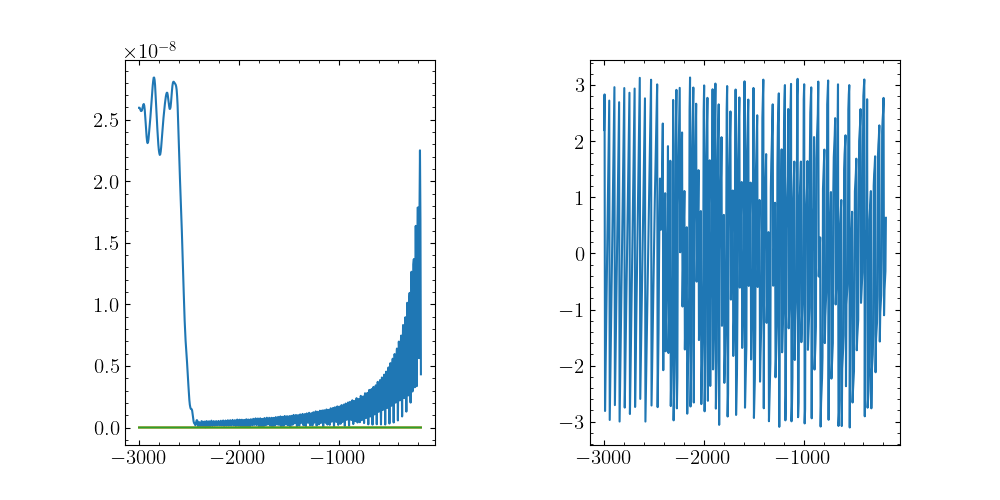

In [63]:
fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})
ax[0].plot(grid.x[:,180], np.abs(s.fields['EH_pri'].Hy[:,180]), label='$H_y$')
ax[0].plot(grid.x[:,180], np.abs(s.fields['EH_pri'].Hx[:,180]), label='$H_x$')
ax[0].plot(grid.x[:,180], np.abs(s.fields['EH_pri'].Hz[:,180]), label='$H_z$')
ax[1].plot(grid.x[:,180], np.angle(s.fields['EH_pri'].Hy[:,180]*phase_factor[:,180]))

In [34]:
s.plotBeam2D('EH_ff', PyPO.Enums.FieldComponents.Ex)

2026-02-18 15:10:39 - ERROR - Field EH_ff not in system. 


FieldNameError: 

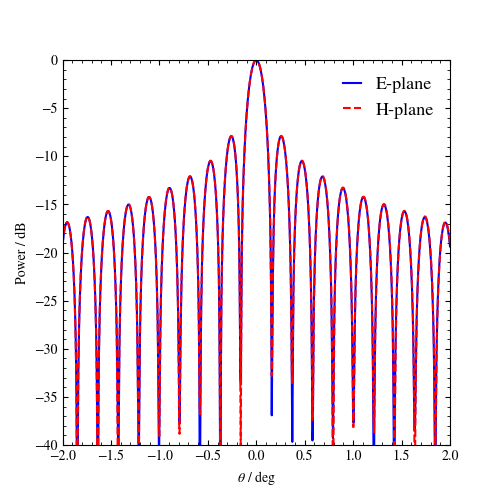

In [ ]:
s.plotBeamCut('EH_ff', PyPO.Enums.FieldComponents.Ex, scale=Scales.dB, vmin=-40)